In [1]:
import nltk as nltk
import pandas as pd
from nltk.tokenize import word_tokenize
from nltk.stem import *
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
import re
import tensorflow as tf
from nltk.stem import WordNetLemmatizer 
import spacy
from textblob import TextBlob,Word
import json
import csv
import tqdm
import random

In [ ]:
from nltk.corpus.reader import reviews
from reviews import products

#### Conveting the JSON file to a CSV for ease of use

In [2]:
# Read JSON file
with open('yelp_dataset/yelp_academic_dataset_review.json', 'r', encoding='utf-8') as json_file:
    data = json_file.readlines()

# Parse JSON data
parsed_data = [json.loads(entry) for entry in data]
# print(len(parsed_data))
# Take a random subset of n entries
n = 1500000  # Specify the number of entries you want
random_subset = random.sample(parsed_data, n)

# Define CSV headers
headers = random_subset[0].keys()

# Write to CSV file
with open('output_subset.csv', 'w', newline='', encoding='utf-8') as csv_file:
    writer = csv.DictWriter(csv_file, fieldnames=headers)
    writer.writeheader()
    for entry in random_subset:
        writer.writerow(entry)

## Importing Dataset

In [2]:
review_data = pd.read_csv("output_subset.csv")

In [3]:
review_data.head(5)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,zlbF53pDfNjEkwyE_Vk0Aw,Fa-y-UhGMXqTyBuQcFnCPw,AaWmckcT3O1iQSAIUmzwUA,5.0,0,0,1,"Excellent casual breakfast, coffee, juice plac...",2017-02-14 17:24:25
1,TYyLLcJuj-MBjPI0_ntt0w,suNzNMkhgRysETp-1DD6KQ,Gksv0lbchfKxljBm5puCBQ,5.0,0,0,0,Very pleasant visit to Porta Via! Everything w...,2019-11-11 02:34:32
2,HZA5CQSb8hg6nNnhVH8LhQ,C2nzoqU60AcRPHpCBsEScQ,7pwZZVVlYCxQvVdd8Q03wg,5.0,0,0,0,This is a quality pie for an affordable price!...,2018-08-11 01:54:24
3,NZknXeNHz6LYqUKwUcUx1Q,0MAFlyfHJTWV8Fojl3l8oA,TUhRukcZb3tG0cB_X68FCQ,2.0,2,0,0,I used to like this place when they first open...,2014-04-26 21:29:28
4,GwUy47wozKnKFse-sWinUQ,L_2l7i9aJASXPY1j926MwQ,GltVrzwcDYT9Om8tW6H3FA,4.0,0,0,0,I went here to find some specific graphic nove...,2014-12-22 05:15:04


#### Removing unneccessary features

In [4]:
review_data.drop(labels=['review_id', 'user_id', 'business_id', 'date'], axis=1, inplace=True)

In [5]:
review_data.head(5)

,stars,useful,funny,cool,text
0,5.0,0,0,1,"Excellent casual breakfast, coffee, juice plac..."
1,5.0,0,0,0,Very pleasant visit to Porta Via! Everything w...
2,5.0,0,0,0,This is a quality pie for an affordable price!...
3,2.0,2,0,0,I used to like this place when they first open...
4,4.0,0,0,0,I went here to find some specific graphic nove...


In [6]:
review_data['stars'].value_counts()

stars
5.0    693239
4.0    311963
1.0    229105
3.0    148508
2.0    117185
Name: count, dtype: int64

## Tokenization and Basic Preprocessing

##### Stopwords

In [7]:
nltk_swords = set(stopwords.words("english"))
print(nltk_swords)

{'yourselves', 'herself', 'been', 'is', 'had', 'over', 'no', 'each', 'ain', 'those', 'or', 'hers', 'very', "you'll", 'am', 'yourself', 'does', 'by', 'aren', 'once', 'at', 'him', 'more', 'my', 'down', 'of', "shouldn't", "you're", "you've", 'who', 'to', 'from', "aren't", 'their', 'a', 'do', 'too', 'should', "mightn't", 'd', 'if', 'off', 'will', 'm', 'with', 'our', "wasn't", 'his', "should've", 't', 'only', 's', 'these', 'how', 'between', 'against', 'we', 'above', 'has', 'before', 'until', "needn't", 'myself', 'and', 'o', "you'd", "don't", 'this', 'same', 'doesn', 'for', 'there', 'all', 'me', "shan't", 'did', 'itself', 'was', 'have', 'himself', 'out', 'after', 'than', 'shouldn', 'as', 'few', 'then', 'just', 'up', 'isn', 've', "weren't", 'i', "won't", 'further', 'because', 'won', 'what', 'so', 'that', 'but', 'such', 'about', 'in', 'under', 'nor', 'he', 'her', "haven't", 'having', 'being', 'both', 'into', 'doing', 'again', 'can', "hadn't", 'theirs', 'mustn', 'are', 'ours', 'below', 'couldn'

##### A function to preprocess text


In [8]:
def clean_text(txt, tokenize = True):
    #remove links
    txt = re.sub(r"http\S+", "", txt)
    
    #remove non-alphanumeric characters
    pattern = r'[^\w\s]'
    txt = re.sub(pattern, '', txt)
    
    #remove underscores
    txt = re.sub('_', '', txt)
    
    #remove excessively repeated letters from words that contain more than 2 letters occuring consecutively
    pattern2 = r"(.)\1{2,}" 
    txt = re.sub(pattern2, r"\1\1", txt)
    
    #lower_text 
    txt = txt.lower()
    
    #Stopword removal
    swords = set(stopwords.words("english"))
    txt = txt.split()
    
    if tokenize == True:
        txt = [w for w in txt if w not in swords]  # Stopword removal
    elif tokenize == False:
        txt = [w for w in txt if w not in swords]
        txt = ' '.join(txt)
    else:
        raise ValueError("Invalid tokenizer_type. Must be 'word' or 'sentence'.")
    return txt


In [9]:
clean_text("If you decide to eat here, just be aware it is")

['decide', 'eat', 'aware']

## Lemmatization

##### Wordnet lemmatizer

In [10]:
wordnet = WordNetLemmatizer()
wordnet.lemmatize("hung")

'hung'

##### Spacy Lemmatizer

In [90]:
spacy_lemmatizer = spacy.load("en_core_web_sm")
word =  "looking at the stripes on her tshirt makes me sick"
tokenized = clean_text(word)
connected = ' '.join([token for token in tokenized])
word_lemma = [token.lemma_ for token in spacy_lemmatizer(connected)]
print(word_lemma)
word_lemma2 = [token.lemma_ for token in spacy_lemmatizer(word)]
word_lemma2

['look', 'stripe', 'tshirt', 'make', 'sick']


['look', 'at', 'the', 'stripe', 'on', 'her', 'tshirt', 'make', 'I', 'sick']

In [12]:
def lemmatizer(text, text_type = "token", lemmatizer_type = "wordnet"):
    # Wordnet lemmatizer
    # text_type = "token"
    
    if lemmatizer_type == "wordnet":
        if text_type == "token":
            lemmatized = [wordnet.lemmatize(token) for token in text]
        elif text_type == "text":
            lemmatized = [wordnet.lemmatize(token) for token in clean_text(text)]
        else:
            raise ValueError("Invalid text_type. Must be 'token' or 'text'.")
    # Spacy lemmatizer
    elif lemmatizer_type == "spacy":
        spacy_lemmatizer = spacy.load('en_core_web_sm')
        if text_type == "token":
            connected = ' '.join([token for token in text])
            lemmatized = [token.lemma_ for token in spacy_lemmatizer(connected)]
        elif text_type == "text":
            lemmatized = [token.lemma_ for token in spacy_lemmatizer(text)]
        else:
            raise ValueError("Invalid text_type. Must be 'token' or 'text'.")
        
    else:
        raise ValueError("Invalid lemmatizer_type. Must be 'wordnet',or 'spacy'.")
    
    return lemmatized

In [13]:
lemmatizer(word,text_type="text", lemmatizer_type="wordnet")

['looking', 'stripe', 'tshirt', 'make', 'sick']

In [14]:
lemmatizer(word,text_type="text", lemmatizer_type="spacy")

['look', 'at', 'the', 'stripe', 'on', 'her', 'tshirt', 'make', 'I', 'sick']

In [15]:
from tqdm import tqdm
tqdm.pandas()

In [16]:
review_data["clean_text"] = review_data["text"].progress_apply(lambda x: clean_text(x, tokenize=True))

  0%|          | 0/1500000 [00:00<?, ?it/s]

100%|██████████| 1500000/1500000 [09:33<00:00, 2615.39it/s]


In [17]:
review_data.head(5)

,stars,useful,funny,cool,text,clean_text
0,5.0,0,0,1,"Excellent casual breakfast, coffee, juice plac...","[excellent, casual, breakfast, coffee, juice, ..."
1,5.0,0,0,0,Very pleasant visit to Porta Via! Everything w...,"[pleasant, visit, porta, via, everything, wond..."
2,5.0,0,0,0,This is a quality pie for an affordable price!...,"[quality, pie, affordable, price, thick, crust..."
3,2.0,2,0,0,I used to like this place when they first open...,"[used, like, place, first, opened, quality, fo..."
4,4.0,0,0,0,I went here to find some specific graphic nove...,"[went, find, specific, graphic, novels, ton, r..."


In [18]:
review_data["clean_text_lemmatized"] = review_data["clean_text"].progress_apply(lambda x: lemmatizer(x, text_type="token", lemmatizer_type="wordnet"))

  0%|          | 658/1500000 [00:00<07:36, 3285.25it/s]

100%|██████████| 1500000/1500000 [04:33<00:00, 5483.64it/s]


In [19]:
review_data.head(5)

,stars,useful,funny,cool,text,clean_text,clean_text_lemmatized
0,5.0,0,0,1,"Excellent casual breakfast, coffee, juice plac...","[excellent, casual, breakfast, coffee, juice, ...","[excellent, casual, breakfast, coffee, juice, ..."
1,5.0,0,0,0,Very pleasant visit to Porta Via! Everything w...,"[pleasant, visit, porta, via, everything, wond...","[pleasant, visit, porta, via, everything, wond..."
2,5.0,0,0,0,This is a quality pie for an affordable price!...,"[quality, pie, affordable, price, thick, crust...","[quality, pie, affordable, price, thick, crust..."
3,2.0,2,0,0,I used to like this place when they first open...,"[used, like, place, first, opened, quality, fo...","[used, like, place, first, opened, quality, fo..."
4,4.0,0,0,0,I went here to find some specific graphic nove...,"[went, find, specific, graphic, novels, ton, r...","[went, find, specific, graphic, novel, ton, re..."


## Exploratory Data Analysis

In [20]:
review_data.shape

(1500000, 7)

In [21]:
review_data.describe()

,stars,useful,funny,cool
count,1.500000e+06,1.500000e+06,1.500000e+06,1.500000e+06
mean,3.748697e+00,1.186914e+00,3.261427e-01,4.997840e-01
std,1.478221e+00,3.503278e+00,1.602673e+00,2.161966e+00
min,1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00
25%,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,4.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,5.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
max,5.000000e+00,1.182000e+03,3.440000e+02,4.040000e+02


In [22]:
review_data.dtypes

stars                    float64
useful                     int64
funny                      int64
cool                       int64
text                      object
clean_text                object
clean_text_lemmatized     object
dtype: object

In [23]:
import plotly.express as px
import matplotlib.pyplot as plt

In [24]:
px.histogram(review_data, x=review_data["stars"])

In [25]:
review_data["review_length"]=review_data["clean_text_lemmatized"].progress_apply(lambda x: len(x))
review_data['review_length'].max()

100%|██████████| 1500000/1500000 [00:00<00:00, 1641387.41it/s]


545

In [26]:
review_data.head(5)

,stars,useful,funny,cool,text,clean_text,clean_text_lemmatized,review_length
0,5.0,0,0,1,"Excellent casual breakfast, coffee, juice plac...","[excellent, casual, breakfast, coffee, juice, ...","[excellent, casual, breakfast, coffee, juice, ...",34
1,5.0,0,0,0,Very pleasant visit to Porta Via! Everything w...,"[pleasant, visit, porta, via, everything, wond...","[pleasant, visit, porta, via, everything, wond...",21
2,5.0,0,0,0,This is a quality pie for an affordable price!...,"[quality, pie, affordable, price, thick, crust...","[quality, pie, affordable, price, thick, crust...",37
3,2.0,2,0,0,I used to like this place when they first open...,"[used, like, place, first, opened, quality, fo...","[used, like, place, first, opened, quality, fo...",48
4,4.0,0,0,0,I went here to find some specific graphic nove...,"[went, find, specific, graphic, novels, ton, r...","[went, find, specific, graphic, novel, ton, re...",55


In [27]:
sentance = ' '.join(words for words in review_data['clean_text_lemmatized'][0])
sentance

'excellent casual breakfast coffee juice place nice staff egg sandwich english muffin expertly prepared fill hungry male perfect hungry woman juice tasty got green yogurt parfait fan friggentastic granola chart organic priority highly recommend'

In [28]:
review_data["sents"] = review_data["clean_text_lemmatized"].progress_apply(lambda words: ' '.join(words))
review_data.head(5)

100%|██████████| 1500000/1500000 [00:03<00:00, 486810.87it/s]


,stars,useful,funny,cool,text,clean_text,clean_text_lemmatized,review_length,sents
0,5.0,0,0,1,"Excellent casual breakfast, coffee, juice plac...","[excellent, casual, breakfast, coffee, juice, ...","[excellent, casual, breakfast, coffee, juice, ...",34,excellent casual breakfast coffee juice place ...
1,5.0,0,0,0,Very pleasant visit to Porta Via! Everything w...,"[pleasant, visit, porta, via, everything, wond...","[pleasant, visit, porta, via, everything, wond...",21,pleasant visit porta via everything wonderful ...
2,5.0,0,0,0,This is a quality pie for an affordable price!...,"[quality, pie, affordable, price, thick, crust...","[quality, pie, affordable, price, thick, crust...",37,quality pie affordable price thick crust pie l...
3,2.0,2,0,0,I used to like this place when they first open...,"[used, like, place, first, opened, quality, fo...","[used, like, place, first, opened, quality, fo...",48,used like place first opened quality food gone...
4,4.0,0,0,0,I went here to find some specific graphic nove...,"[went, find, specific, graphic, novels, ton, r...","[went, find, specific, graphic, novel, ton, re...",55,went find specific graphic novel ton recent on...


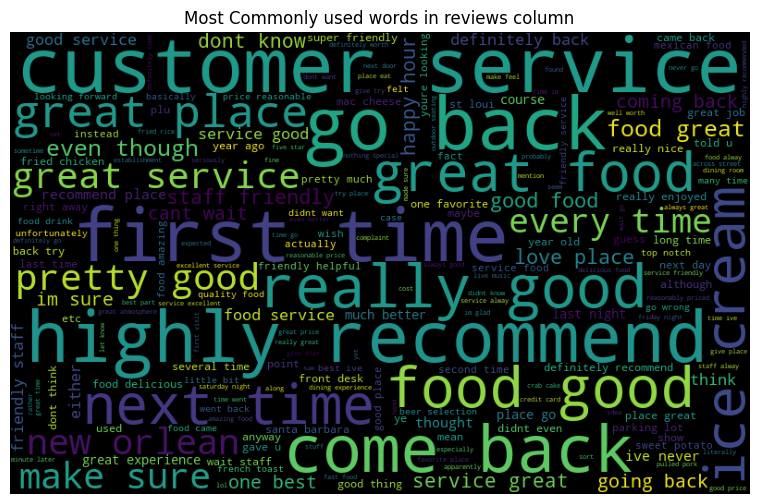

In [29]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Initialize an empty string
all_words = ''

# Process the data in chunks
chunk_size = 10000  
for i in range(0, len(review_data["sents"]), chunk_size):
    chunk = review_data["sents"][i:i+chunk_size]
    all_words += ' '.join(chunk)

# Generate the word cloud
wordcloud = WordCloud(width=800, height=500, max_font_size=100).generate(all_words)

# Display the word cloud
plt.figure(figsize=(15,6))
plt.imshow(wordcloud)
plt.axis('off')
plt.title("Most Commonly used words in reviews column")
plt.show()

In [98]:
from collections import Counter

In [101]:
# Count tokens
token_counts = Counter(token for tokens in review_data["clean_text_lemmatized"] for token in tokens)

food 784728
place 750935
good 712027
great 656306
time 603128
service 509348
get 481195
one 476199
like 471197
back 435166
would 423340
go 392319
really 342714
also 322767
u 305692
got 289136
order 271189
restaurant 264099
even 262296
nice 261306


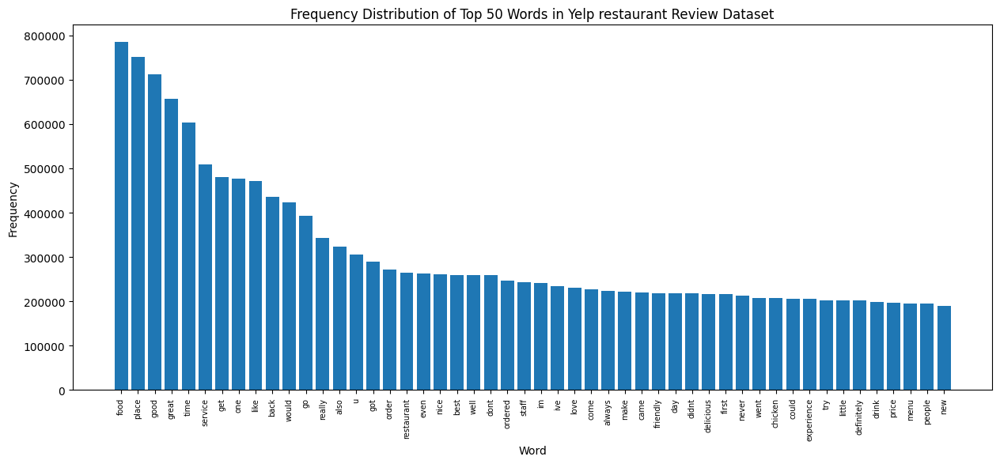

In [103]:
top_20_tokens = token_counts.most_common(20)
for token, count in top_20_tokens:
    print(token, count)

# Plot top 50 tokens
top_50_tokens = token_counts.most_common(50)
tokens, counts = zip(*top_50_tokens)

plt.figure(figsize=(15,6))
plt.bar(tokens, counts)
plt.xlabel("Word")
plt.xticks(fontsize=7 ,rotation = 90)
plt.ylabel("Frequency")
plt.title("Frequency Distribution of Top 50 Words in Yelp restaurant Review Dataset")
plt.show()

## Splitting Vectorization and Modelling

In [30]:
from sklearn.model_selection import train_test_split
import sklearn.feature_extraction.text as sk_text
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score
from sklearn import preprocessing

In [31]:
X = review_data["sents"].values
y = review_data["stars"].values

In [32]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.25, random_state=42)

In [33]:
print(X.shape, X_train.shape, X_test.shape)

(1500000,) (1125000,) (375000,)


### Vectorization 

In [60]:
def vectorize_text(tokens, vectorizer_type="tfidf", vectorizer=None):
    if vectorizer is None:
        if vectorizer_type == "tfidf":
            vectorizer = sk_text.TfidfVectorizer()
        elif vectorizer_type == "count":
            vectorizer = sk_text.CountVectorizer(analyzer='word', ngram_range=(1, len(tokens)))
        else:
            raise ValueError("Invalid vectorizer_type. Must be 'tfidf' or 'count'")
    
    output_vector = vectorizer.fit_transform([tokens])
    
    return output_vector

In [61]:
vectorize_text("you are so beautiful just like the moon",vectorizer_type="tfidf")

<1x8 sparse matrix of type '<class 'numpy.float64'>'
	with 8 stored elements in Compressed Sparse Row format>

In [62]:
vectorize_text("you are so beautiful just like the moon",vectorizer_type="count")

<1x36 sparse matrix of type '<class 'numpy.int64'>'
	with 36 stored elements in Compressed Sparse Row format>

In [37]:
def vectorize_data(x_train,x_test, vectorizer_type="tfidf"):
    
    if vectorizer_type == "tfidf":
        vectorizer = sk_text.TfidfVectorizer()
    elif vectorizer_type == "count":
        vectorizer = sk_text.CountVectorizer()
    else:
        raise ValueError("Invalid vectorizer_type. Must be 'tfidf' or 'count'")
    
    x_train = vectorizer.fit_transform(x_train)
    x_test = vectorizer.transform(x_test)
    
    return x_train,x_test

In [38]:
X_train_vec_tfidf,X_test_vec_tfidf = vectorize_data(X_train,X_test , vectorizer_type="tfidf")

In [39]:
X_train_vec_count,X_test_vec_count= vectorize_data(X_train,X_test,vectorizer_type="count")

In [40]:
X_train_vec_tfidf

<1125000x459948 sparse matrix of type '<class 'numpy.float64'>'
	with 50637941 stored elements in Compressed Sparse Row format>

In [41]:
X_train_vec_count

<1125000x459948 sparse matrix of type '<class 'numpy.int64'>'
	with 50637941 stored elements in Compressed Sparse Row format>

In [95]:
def model_evaluation(X_train,X_test,y_train,y_test,model):
    X_train_prediction = model.predict(X_train)
    training_data_accuracy = accuracy_score(y_train, X_train_prediction)
    training_data_precision = precision_score(y_train,X_train_prediction, average='weighted')
    training_data_recall = recall_score(y_train,X_train_prediction, average='weighted')
    training_data_f1 = f1_score(y_train,X_train_prediction, average='weighted')

    X_test_prediction = model.predict(X_test)
    testing_data_accuracy = accuracy_score(y_test, X_test_prediction)
    testing_data_precision = precision_score(y_test,X_test_prediction, average='weighted')
    testing_data_recall = recall_score(y_test,X_test_prediction, average='weighted')
    testing_data_f1 = f1_score(y_test,X_test_prediction, average='weighted')
    
    print(f"Testing Data Accuracy: {testing_data_accuracy} \nTraining Data Accuracy: {training_data_accuracy}")
    print(f"\nTesting Data Precision: {testing_data_precision} \nTraining Data Precision: {training_data_precision}")
    print(f"\nTesting Data Recall: {testing_data_recall} \nTraining Data Recall: {training_data_recall}")
    print(f"\nTesting Data f1: {testing_data_f1} \nTraining Data f1: {training_data_f1}")


## MultinomialNB

In [42]:
from sklearn.naive_bayes import MultinomialNB
multi_nb = MultinomialNB()

In [43]:
y_pred = multi_nb.fit(X_train_vec_count,y_train)

In [96]:
model_evaluation(X_train_vec_count,X_test_vec_count,y_train,y_test,multi_nb)

Testing Data Accuracy: 0.6237013333333333 
Training Data Accuracy: 0.6531475555555556

Testing Data Precision: 0.6302387781174073 
Training Data Precision: 0.662263692205392

Testing Data Recall: 0.6237013333333333 
Training Data Recall: 0.6531475555555556

Testing Data f1: 0.6232175592360394 
Training Data f1: 0.6541163010991177


## LinearSVC

In [45]:
from sklearn import svm

In [46]:
from sklearn.svm import LinearSVC
lsvc = LinearSVC()
lsvc.fit(X_train_vec_tfidf,y_train)

c:\programming\Python311\Lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning:

The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.



LinearSVC()

In [97]:
model_evaluation(X_train_vec_tfidf,X_test_vec_tfidf,y_train,y_test,lsvc)

Testing Data Accuracy: 0.6785653333333334 
Training Data Accuracy: 0.7687626666666667

Testing Data Precision: 0.6460002119426627 
Training Data Precision: 0.7586341067293887

Testing Data Recall: 0.6785653333333334 
Training Data Recall: 0.7687626666666667

Testing Data f1: 0.6519873377884672 
Training Data f1: 0.7539803333910352


In [48]:
X_data = X_test_vec_tfidf[15]
print(y_test[15])

prediction = lsvc.predict(X_data)
print(prediction)

5.0
[5.]


In [74]:
vectorizer_tfidf = sk_text.TfidfVectorizer()
vectorizer_tfidf.fit(X_train)

TfidfVectorizer()

In [75]:
vectorizer_count = sk_text.CountVectorizer()
vectorizer_count.fit(X_train)

CountVectorizer()

In [78]:
def text_vectorizer_tfidf(tokens, vectorizer):
    output_vector = vectorizer.transform([tokens])
    return output_vector

def text_vectorizer_count(tokens, vectorizer):
    output_vector = vectorizer.transform([tokens])
    return output_vector

In [79]:
def predict_sentiment(input_text, model, vectorizer_type="tfidf"):
    input_text = clean_text(input_text, tokenize=False)
    if vectorizer_type == "tfidf":
        input_vectorized = text_vectorizer_tfidf(input_text, vectorizer_tfidf)
    elif vectorizer_type == "count":
        input_vectorized = text_vectorizer_count(input_text, vectorizer_count)
    prediction = model.predict(input_vectorized)

    if prediction[0] == 1:
        return 'Negative'
    elif (prediction[0]==2 or prediction[0]==3):
        return 'Average'
    else:
      return 'Good'


In [92]:
user_input = input("Enter a tweet: ")
result_multinb = predict_sentiment(user_input, multi_nb, vectorizer_type="count")
result_lsvc = predict_sentiment(user_input, lsvc, vectorizer_type="tfidf")
print("Input: ", user_input)
print("Prediction_Multinb: ", result_multinb)
print("Prediction_lsvc: ",result_lsvc)

Input:  the place was great but the food could have been better service was acceptable but not worth the cost
Prediction_Multinb:  Average
Prediction_lsvc:  Average
